### IMPORTS

In [1]:
import torch
torch.manual_seed(0)
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import torchvision.models as models
from torchvision import transforms
from IPython.display import display
import PIL
from PIL import ImageFilter

### IMAGENET UTILS

In [2]:
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

def preprocess_image(image):
    image = (image - mean) / std
    image = np.expand_dims(image, axis=0).transpose(0,3,1,2)
    return torch.Tensor(image)

def deprocess_image(tensor):
    tensor = ((tensor * std) + mean)
    tensor = np.uint8(tensor * 255.0)
    return PIL.Image.fromarray(tensor)

### TEST IMAGE

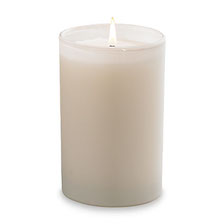

In [3]:
TEST_IMAGE = PIL.Image.open("./test_images/candle.jpg")
display(TEST_IMAGE)
preprocessed_image = preprocess_image(np.asarray(TEST_IMAGE)/255.0)

### MODEL

In [4]:
model = models.resnet18(pretrained=True)
model.cuda()
model.eval()
print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

### ACTIVATIONS

In [5]:
class ActivationsExtractor():
    
    def __init__(self, module):
        self.hook = module.register_forward_hook(self.hook_fn)
        
    def hook_fn(self, module, input, output):
        self.features = output

In [6]:
layer = list(model.children())[-2] # last non-output layer

In [7]:
activations = ActivationsExtractor(layer) # activations' hook

In [8]:
_ = model(preprocessed_image.cuda()) # forward pass to collect activations

In [9]:
average_activations_per_filters = [activations.features[0, i].mean().item() for i in range(activations.features.shape[1])]

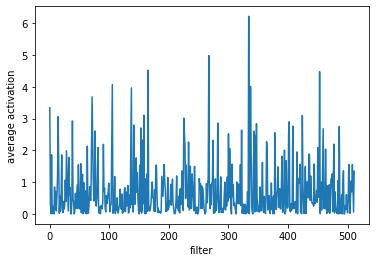

In [10]:
fig = plt.plot(average_activations_per_filters)
ax = fig[0].axes
ax.set_xlabel("filter")
ax.set_ylabel("average activation")
plt.show()

In [11]:
most_activated_filter_idx = np.argmax(average_activations_per_filters)
print(most_activated_filter_idx)

334


### FILTERS

In [12]:
def visualize(lr, steps, size, upscales, upscale_factor):
    img = np.uint8(np.random.uniform(0, 1, (size, size, 3)))
    
    for _ in range(upscales):
        
        img_var = preprocess_image(img).clone().detach().cuda().requires_grad_(True)
        optimizer = torch.optim.Adam([img_var], lr=lr, weight_decay=1e-6)

        for _ in range(steps):
            optimizer.zero_grad()
            model(img_var)
            loss = -activations.features[0, most_activated_filter_idx].mean()
            loss.backward()
            optimizer.step()

        img = deprocess_image(img_var.data.cpu().numpy()[0].transpose(1,2,0))
        display(img)

        size = int(upscale_factor * size) 
        img = img.resize((size, size)) 
        img = img.filter(ImageFilter.BLUR)
        img = np.asarray(img) / 255.0

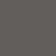

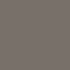

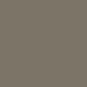

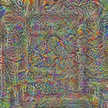

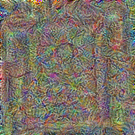

...

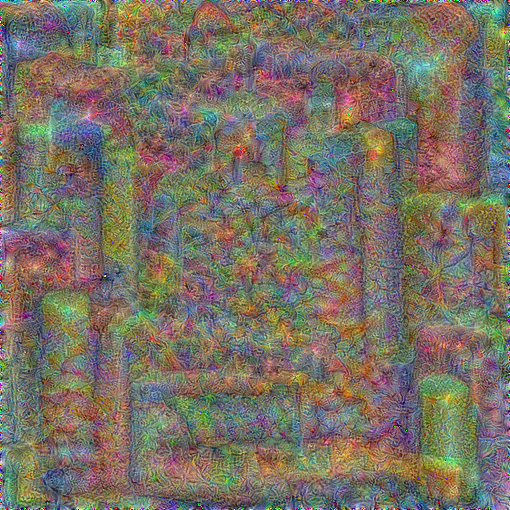

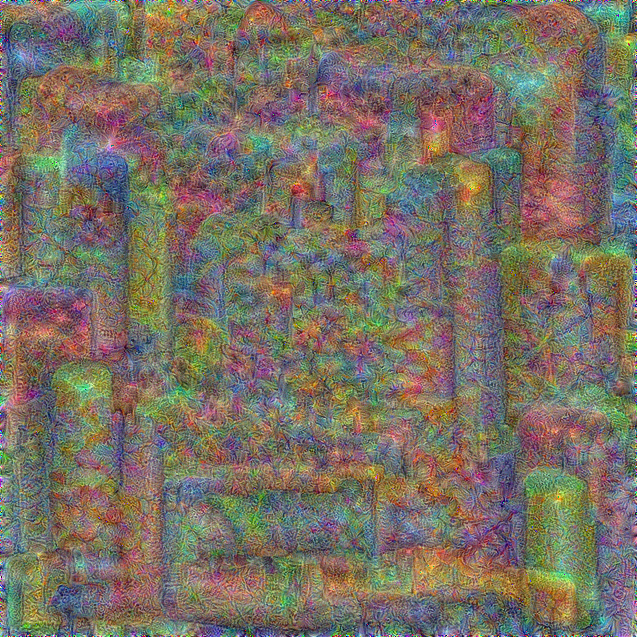

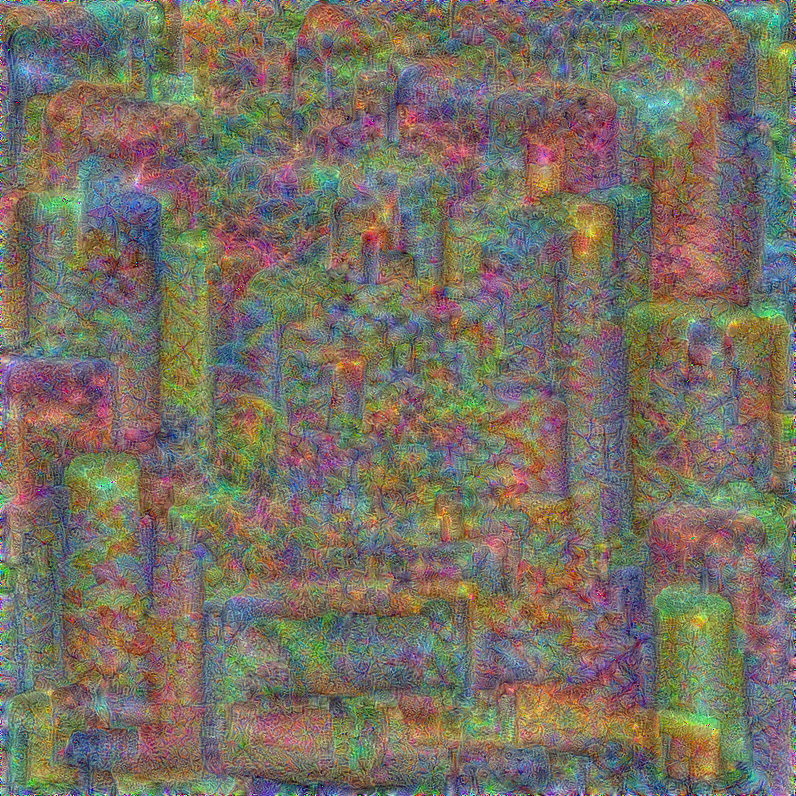

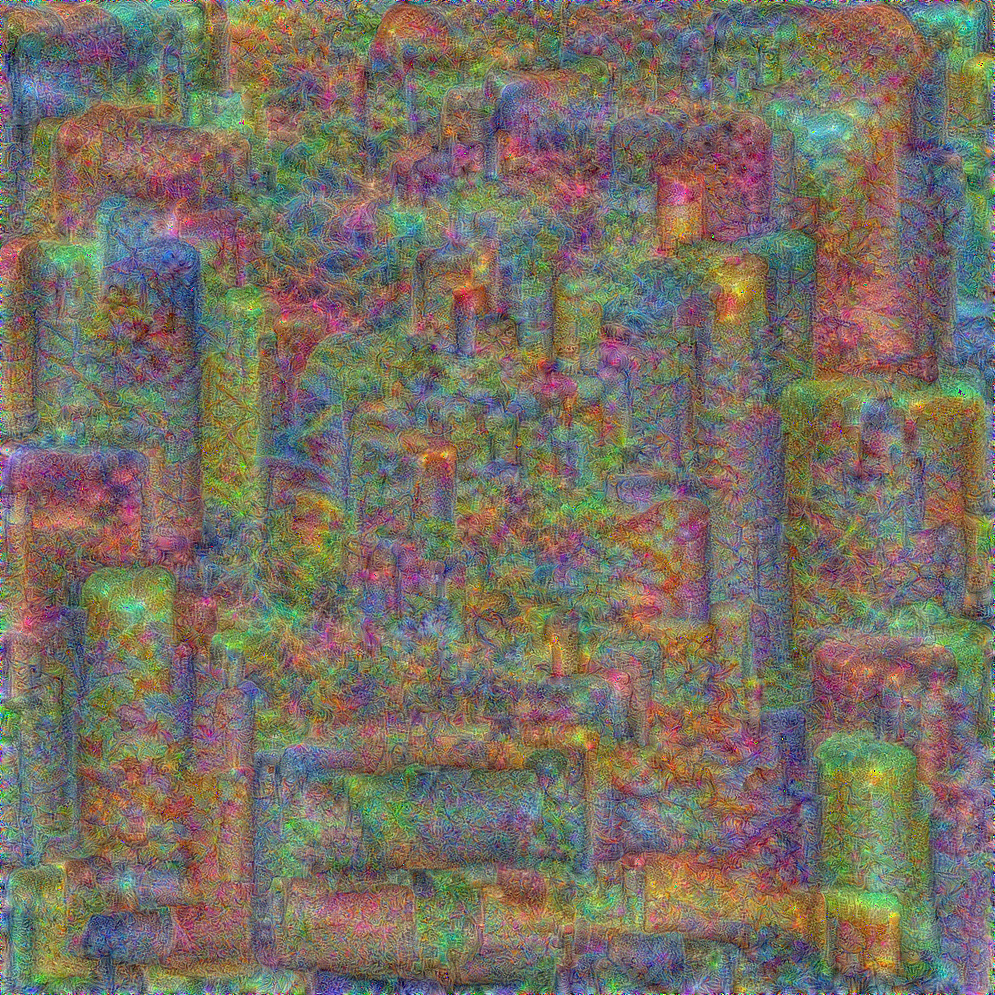

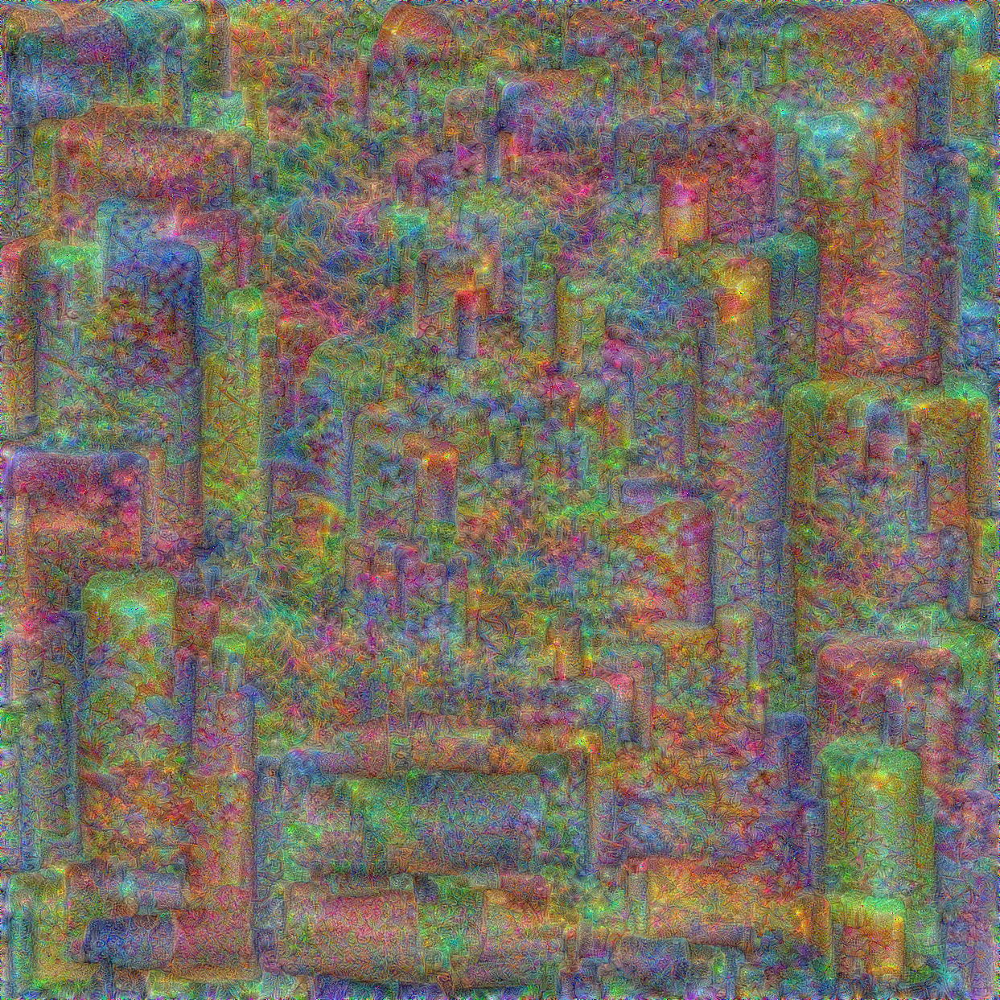

In [13]:
visualize(lr=0.075,
          size=56,
          steps=25,
          upscales=15,
          upscale_factor=1.25)